<a href="https://colab.research.google.com/github/gurpreetschohan/NBASentimentAnalysis/blob/main/Lebron_Analysis_Final_.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Analysis comparing NBA Fan sentiment towards LeBron James Before and After Breaking the All Time Scoring Record

Max Rodriguez (arodr395@calpoly.edu) Solomon Zhou (szhou11@calpoly.edu) Gurpreet Chohan (gchohan@calpoly.edu)

March 9th, 2023

#INTRODUCTION

LeBron James is one of the most influential professional athletes. Throughout his career he has accomplished championships, mvp awards, olympic gold medals, all-star selections, and recently broke the all time scoring record in the NBA (which stood for around 40 years by Kareem Abdul-Jabbar). However throughout LeBron’s career, it seems that he received more hate than praise by NBA fans. 

We hypothesize there will be a positive change in opinion about LeBron James after he breaks the all time scoring record in the NBA. We believe that fans base their opinions of NBA players on their achievements (NBA championship, MVP, scoring record, etc). Hence, fans will not be able to argue against the fact that LeBron James now holds the all time scoring record. 

This analysis is exploring the change in sentiment of LeBron James before and after he broke the all-time scoring record in the NBA. We scraped 50,000 tweets before,during and after the game in which the record was broken. Will fans finally acknowledge his greatness or continue hating? 


#LIBRARIES

In [26]:
%%capture
pip install praw

In [27]:
%%capture
pip install asyncpraw

In [28]:
%%capture
!pip install matplotlib

In [29]:
%%capture
!pip install wordcloud

In [63]:
%%capture
pip install snscrape

In [ ]:
# This is the python API wrapper
import praw
import pandas as pd
import asyncio
import json
import time
import csv
import aiohttp
#asyncpraw works better in Google colab
#For Sentiment analysis
from textblob import TextBlob
import nltk
nltk.download('stopwords')
import matplotlib.pyplot as plt
from wordcloud import WordCloud
from IPython.display import Image
import scipy as stats
from scipy import stats, optimize, interpolate
import rpy2.robjects as ro
from rpy2.robjects.packages import importr
from rpy2.robjects import pandas2ri
from rpy2.robjects.conversion import localconverter
from rpy2.robjects import globalenv
import re

In [ ]:
import nltk
nltk.download('brown')
nltk.download('punkt')

# SENTIMENT ANALYSIS WITH TWITTER 


Importing data from drive

In [32]:
import requests

from google.colab import drive
drive.mount('/content/drive')

tweet_before = pd.read_csv('/content/drive/My Drive/AWS Class Project/before_tweets.csv')
tweet_after = pd.read_csv('/content/drive/My Drive/AWS Class Project/after_tweets.csv')
tweet_during = pd.read_csv('/content/drive/My Drive/AWS Class Project/during_game_tweets.csv')
tweet_during2 = pd.read_csv('/content/drive/My Drive/AWS Class Project/during_game_tweets.csv')

tweet_before.rename({'Unnamed: 0': 'ID'}, axis=1, inplace=True)
tweet_after.rename({'Unnamed: 0': 'ID'}, axis=1, inplace=True)
tweet_during.rename({'Unnamed: 0': 'ID'}, axis=1, inplace=True)
tweet_during2.rename({'Unnamed: 0': 'ID'}, axis=1, inplace=True)

before = tweet_before[['ID','Tweet']].copy()
after = tweet_after[['ID','Tweet']].copy()
during = tweet_during[['Date','Tweet']].copy()
during2 = tweet_during2[['ID','Tweet']].copy()

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [33]:
result = before.dtypes
print(result)

ID        int64
Tweet    object
dtype: object


In [34]:
during['Hour'] = pd.to_datetime(during['Date'], errors='coerce', format='%Y-%m-%d %H:%M:%S')

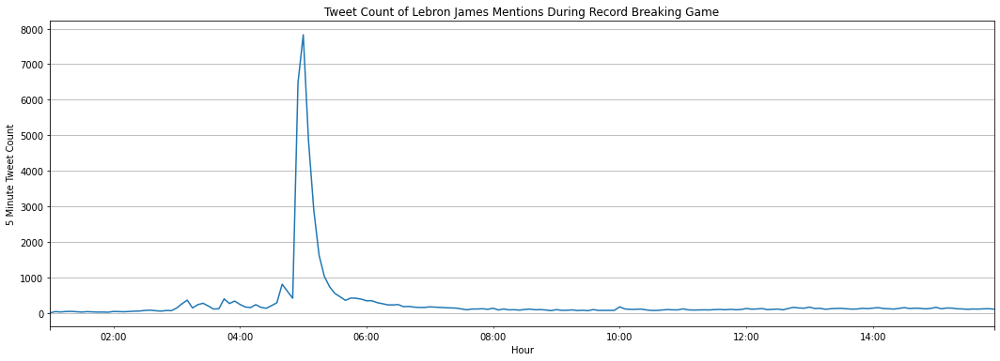

In [35]:
tweet_df_5min = during.groupby(pd.Grouper(key='Hour', freq='5Min', convention='start')).size()
tweet_df_5min.plot(figsize=(18,6))
plt.ylabel('5 Minute Tweet Count')
plt.title("Tweet Count of Lebron James Mentions During Record Breaking Game")
plt.grid(True)

Sentiment Analysis scores before and after scoring record

In [36]:
#before
from textblob import TextBlob
player = ["Lebron James"]

def sentiment_analysis(text_list, players):
    player_sentiment = {person: [] for person in players}
    for text in text_list:
        blob = TextBlob(text)
        sentiment = blob.sentiment.polarity
        for person in players:
            if person.lower() in text.lower():
                player_sentiment[person].append(sentiment)
    results = [(person, sum(sentiments)/len(sentiments)) for person, sentiments in player_sentiment.items()]
    sorted_teams = sorted(player_sentiment.items(), key=lambda x: x[1], reverse=True)
    for person, sentiment in results:
        print(f"{person} - {sentiment:.2f}")
    return player_sentiment


sentiment_scores = sentiment_analysis(before['Tweet'], player)


Lebron James - 0.08


In [37]:
#after
from textblob import TextBlob
player = ["Lebron James"]

def sentiment_analysis(text_list, players):
    player_sentiment = {person: [] for person in players}
    for text in text_list:
        blob = TextBlob(text)
        sentiment = blob.sentiment.polarity
        for person in players:
            if person.lower() in text.lower():
                player_sentiment[person].append(sentiment)
    results = [(person, sum(sentiments)/len(sentiments)) for person, sentiments in player_sentiment.items()]
    sorted_teams = sorted(player_sentiment.items(), key=lambda x: x[1], reverse=True)
    for person, sentiment in results:
        print(f"{person} - {sentiment:.2f}")
    return player_sentiment


sentiment_scores = sentiment_analysis(after['Tweet'], player)

Lebron James - 0.10


**Add Graph comparing them---------------------------------------------------------------------------------**


# STATISTICS

Two Sided T-Test

Null Hypothesis (H0): Total average sentiment before Lebron broke the all time scoring record is the same as the total average sentiment after Lebron broke the all time scoring record

Alternative Hypothesis (Ha): Total average sentiment before Lebron broke the all time scoring record is not the same as the total average sentiment after Lebron broke the all time scoring record

Since the P-Value(0.000000009005023113269) is less than alpha(.05), we reject the Null Hypothesis. Hence, there is a statistically significant difference in the average sentiment.

In [38]:
#lists of all the sentiments after
from textblob import TextBlob

def sentiment_analysis(text_list, players):
    player_sentiment = {person: [] for person in players}
    for text in text_list:
        blob = TextBlob(text)
        sentiment = blob.sentiment.polarity
        for person in players:
            if person.lower() in text.lower():
                player_sentiment[person].append(sentiment)
    results = [(person, sum(sentiments)/len(sentiments)) for person, sentiments in player_sentiment.items()]
    sorted_teams = sorted(player_sentiment.items(), key=lambda x: x[1], reverse=True)
    sentiments = [sentiment for _, sentiments in player_sentiment.items() for sentiment in sentiments]
    return sentiments

player = ["Lebron James"]
sentiments2 = sentiment_analysis(after['Tweet'], player)

In [39]:
#Lists of all the sentiments before
from textblob import TextBlob

def sentiment_analysis(text_list, players):
    player_sentiment = {person: [] for person in players}
    for text in text_list:
        blob = TextBlob(text)
        sentiment = blob.sentiment.polarity
        for person in players:
            if person.lower() in text.lower():
                player_sentiment[person].append(sentiment)
    results = [(person, sum(sentiments)/len(sentiments)) for person, sentiments in player_sentiment.items()]
    sorted_teams = sorted(player_sentiment.items(), key=lambda x: x[1], reverse=True)
    sentiments = [sentiment for _, sentiments in player_sentiment.items() for sentiment in sentiments]
    return sentiments

players = ["Lebron James"]
sentiments1 = sentiment_analysis(before['Tweet'], players)

In [40]:
t_stat, p_value = stats.ttest_ind(sentiments1, sentiments2, trim=.2)

print("T-statistic value: ", t_stat)  
print("P-Value: ", p_value)

T-statistic value:  -5.751042984558759
P-Value:  9.005023113269742e-09


After asserting that their was a difference we were curious to find out who these people were. Where they all positive? Who was negative? And in General what were people saying?

# CLUSTER ANALYSIS

In [41]:
import pandas as pd
from textblob import TextBlob

def get_sentiment_scores(text):
    blob = TextBlob(str(text))  # convert to string (works with before data byt not during data )
    sentiment_scores = []
    for sentence in blob.sentences:
        sentiment_scores.append(sentence.sentiment.polarity)
    return sum(sentiment_scores) / len(sentiment_scores)

during2['Tweet'] = during2['Tweet'].astype(str)
during2['sentiment_score_avg'] = during2['Tweet'].apply(get_sentiment_scores)

In [42]:
#Merge
during2_all = pd.merge(during2, tweet_during2, how='inner', on = 'ID')
during2_all.drop(labels=['Tweet_x'], axis=1, inplace=True)
during2_all.rename(columns={'Tweet_y':'Tweet'},inplace=True)
during2_all

,ID,sentiment_score_avg,Date,User,Tweet,Source
0,0,0.400000,2023-02-08 15:59:46+00:00,mahmoudthegoose,The Lebron James documentary will win an Oscar...,Twitter for iPhone
1,1,-0.016667,2023-02-08 15:59:42+00:00,mrseahawk206,"He still not better then air Jordan. Be real, ...",Twitter for iPhone
2,2,0.000000,2023-02-08 15:59:40+00:00,GregoryJ21_OK,@Tomapapa LeBron James.,Twitter for Android
3,3,0.000000,2023-02-08 15:59:36+00:00,julioccortes94,@NBA God save the #ScoringKing #LeBronJames!!!,Twitter for iPhone
4,4,0.183333,2023-02-08 15:59:34+00:00,BreathlessMusic,So...set up...its a post about Lebron James' w...,Twitter Web App
...,...,...,...,...,...,...
49996,49995,0.208889,2023-02-08 01:04:14+00:00,OmarPierre2023,@RealSkipBayless @undisputed Skip Bayless who ...,Twitter for iPhone
49997,49996,0.750000,2023-02-08 01:04:10+00:00,everyeraatonce,"Just two more hours until my glorious, masterf...",Twitter for iPhone
49998,49997,0.000000,2023-02-08 01:03:53+00:00,itsjust_chris17,35 points tonight #LeBronJames #NBA #KingJames...,Twitter for Android
49999,49998,0.000000,2023-02-08 01:03:49+00:00,Mlimacontador,@elonmusk Lebron James.,Twitter for Android


In [24]:
!pip install rpy2==3.5.1

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [25]:
%load_ext rpy2.ipython

The rpy2.ipython extension is already loaded. To reload it, use:
  %reload_ext rpy2.ipython


In [ ]:
#%reload_ext rpy2.ipython

In [43]:
with localconverter(ro.default_converter + pandas2ri.converter):
  during2_allR = ro.conversion.py2rpy(during2_all)

globalenv['during2_allR'] = during2_allR

In [44]:
%%R

library(cluster)
#convert all needed values into z scores
myData1 <- scale(during2_allR[,2])
head(myData1)

set.seed(1)
#partitioning around medoid 
kResult <- pam(myData1, k=5)
#summary(kResult)
#plot(kResult)



#merging it back with data frame
myDataZ <- data.frame(during2_allR, kResult$clustering)
head(myDataZ)


  ID sentiment_score_avg                      Date            User
0  0          0.40000000 2023-02-08 15:59:46+00:00 mahmoudthegoose
1  1         -0.01666667 2023-02-08 15:59:42+00:00    mrseahawk206
2  2          0.00000000 2023-02-08 15:59:40+00:00   GregoryJ21_OK
3  3          0.00000000 2023-02-08 15:59:36+00:00  julioccortes94
4  4          0.18333333 2023-02-08 15:59:34+00:00 BreathlessMusic
5  5          0.05000000 2023-02-08 15:59:30+00:00 samuelcollier99
                                                                                                                                                                                                                                                                                    Tweet
0                                                                                                                                                                                                                        The Lebron James documentary wil

In [45]:
%R -o myDataZ

We have the most variance in the Negative Group

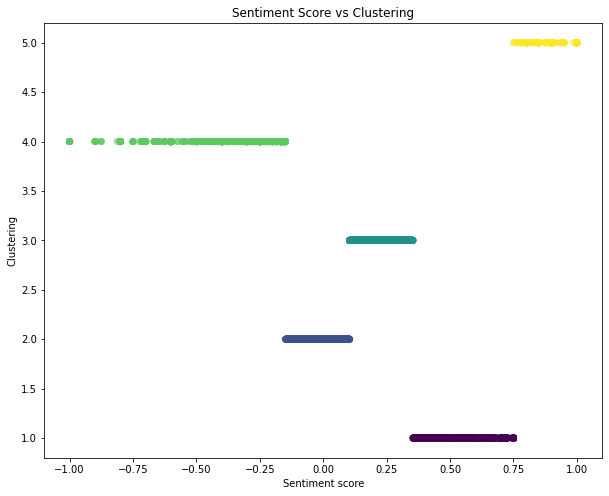

In [46]:
fig = plt.figure(figsize=(10, 8))
plt.scatter(myDataZ['sentiment_score_avg'], myDataZ['kResult.clustering'], c=myDataZ['kResult.clustering'], alpha=0.5)
plt.xlabel('Sentiment score')
plt.ylabel('Clustering')
plt.title('Sentiment Score vs Clustering')
plt.show()

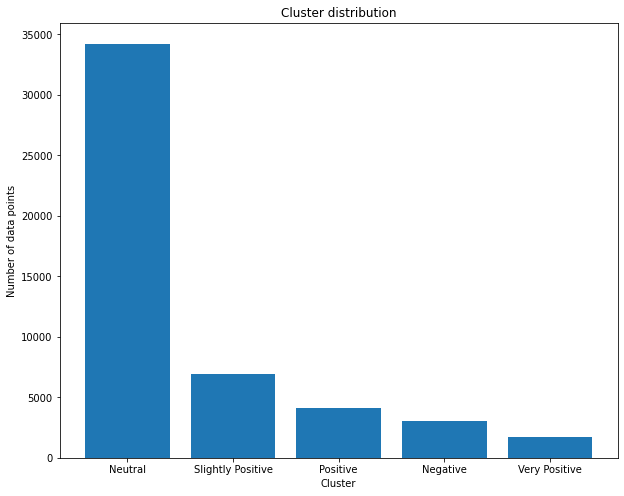

In [47]:
fig = plt.figure(figsize=(10, 8))
cluster_counts = myDataZ['kResult.clustering'].value_counts()
new_labels = ['Neutral', 'Slightly Positive','Positive','Negative', 'Very Positive'] 
plt.bar(new_labels, cluster_counts.values)
plt.xlabel('Cluster')
plt.ylabel('Number of data points')
plt.title('Cluster distribution')
plt.show()

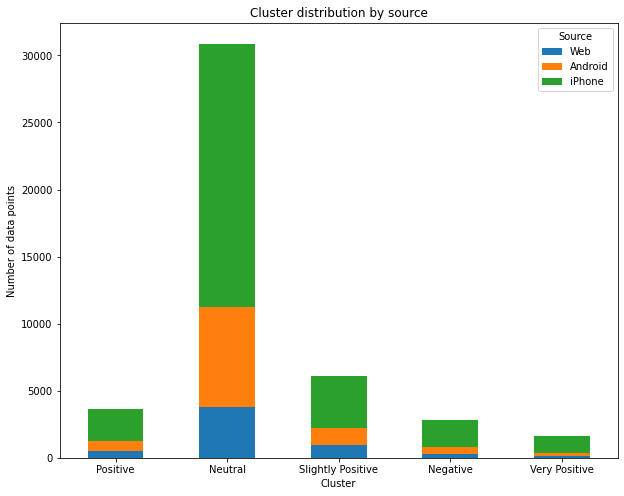

Cluster Positive: Largest source is iPhone
Cluster Neutral: Largest source is iPhone
Cluster Slightly Positive: Largest source is iPhone
Cluster Negative: Largest source is iPhone
Cluster Very Positive: Largest source is iPhone


In [48]:
#myDataZ


sources = ['Twitter for iPhone', 'Twitter for Android','Twitter Web App']
myDataZ = myDataZ[myDataZ['Source'].isin(sources)]

grouped = myDataZ.groupby(['kResult.clustering', 'Source'])['ID'].count().reset_index()

#Pivot data to create a table for the stacked bar chart
table = pd.pivot_table(grouped, values='ID', index='kResult.clustering', columns='Source')

#Rename 
new_labels = {
    'Twitter for iPhone': 'iPhone',
    'Twitter for Android': 'Android',
    'Twitter Web App': 'Web'
}
table = table.rename(columns=new_labels)

#Rename the clusters
cluster_labels = {
    1: 'Positive',
    2: 'Neutral',
    3: 'Slightly Positive',
    4: 'Negative',
    5: 'Very Positive'
}
table = table.rename(index=cluster_labels)

# Create chart
ax = table.plot(kind='bar', stacked=True, figsize=(10, 8))
ax.set_xticklabels(ax.get_xticklabels(), rotation=0)
plt.xlabel('Cluster')
plt.ylabel('Number of data points')
plt.title('Cluster distribution by source')
plt.legend(title='Source')
plt.show()


largest_source = table.idxmax(axis=1)

for i in range(len(largest_source)):
    cluster = cluster_labels[i+1]
    source = largest_source[i]
    print(f"Cluster {cluster}: Largest source is {source}")

In [49]:
#Positive
%%R
summary(subset(myDataZ, kResult.clustering == 1))


      ID            sentiment_score_avg     Date               User          
 Length:4096        Min.   :0.3542      Length:4096        Length:4096       
 Class :character   1st Qu.:0.4500      Class :character   Class :character  
 Mode  :character   Median :0.5000      Mode  :character   Mode  :character  
                    Mean   :0.4988                                           
                    3rd Qu.:0.5000                                           
                    Max.   :0.7500                                           
    Tweet              Source          kResult.clustering
 Length:4096        Length:4096        Min.   :1         
 Class :character   Class :character   1st Qu.:1         
 Mode  :character   Mode  :character   Median :1         
                                       Mean   :1         
                                       3rd Qu.:1         
                                       Max.   :1         


In [50]:
#Neutral
%%R
summary(subset(myDataZ, kResult.clustering == 2))

      ID            sentiment_score_avg      Date               User          
 Length:34233       Min.   :-0.1500000   Length:34233       Length:34233      
 Class :character   1st Qu.: 0.0000000   Class :character   Class :character  
 Mode  :character   Median : 0.0000000   Mode  :character   Mode  :character  
                    Mean   : 0.0005408                                        
                    3rd Qu.: 0.0000000                                        
                    Max.   : 0.1041667                                        
    Tweet              Source          kResult.clustering
 Length:34233       Length:34233       Min.   :2         
 Class :character   Class :character   1st Qu.:2         
 Mode  :character   Mode  :character   Median :2         
                                       Mean   :2         
                                       3rd Qu.:2         
                                       Max.   :2         


In [51]:
#Slightly Positive
%%R
summary(subset(myDataZ, kResult.clustering == 3))

      ID            sentiment_score_avg     Date               User          
 Length:6887        Min.   :0.1042      Length:6887        Length:6887       
 Class :character   1st Qu.:0.1527      Class :character   Class :character  
 Mode  :character   Median :0.2083      Mode  :character   Mode  :character  
                    Mean   :0.2190                                           
                    3rd Qu.:0.2750                                           
                    Max.   :0.3542                                           
    Tweet              Source          kResult.clustering
 Length:6887        Length:6887        Min.   :3         
 Class :character   Class :character   1st Qu.:3         
 Mode  :character   Mode  :character   Median :3         
                                       Mean   :3         
                                       3rd Qu.:3         
                                       Max.   :3         


In [52]:
#Negative
%%R
summary(subset(myDataZ, kResult.clustering == 4))

      ID            sentiment_score_avg     Date               User          
 Length:3055        Min.   :-1.0000     Length:3055        Length:3055       
 Class :character   1st Qu.:-0.4000     Class :character   Class :character  
 Mode  :character   Median :-0.3000     Mode  :character   Mode  :character  
                    Mean   :-0.3313                                          
                    3rd Qu.:-0.2000                                          
                    Max.   :-0.1500                                          
    Tweet              Source          kResult.clustering
 Length:3055        Length:3055        Min.   :4         
 Class :character   Class :character   1st Qu.:4         
 Mode  :character   Mode  :character   Median :4         
                                       Mean   :4         
                                       3rd Qu.:4         
                                       Max.   :4         


In [53]:
%%R
negative_group_df <- myDataZ[myDataZ$kResult.clustering == 4, ]

In [54]:
#Very Positive
%%R
summary(subset(myDataZ, kResult.clustering == 5))

      ID            sentiment_score_avg     Date               User          
 Length:1730        Min.   :0.7500      Length:1730        Length:1730       
 Class :character   1st Qu.:1.0000      Class :character   Class :character  
 Mode  :character   Median :1.0000      Mode  :character   Mode  :character  
                    Mean   :0.9623                                           
                    3rd Qu.:1.0000                                           
                    Max.   :1.0000                                           
    Tweet              Source          kResult.clustering
 Length:1730        Length:1730        Min.   :5         
 Class :character   Class :character   1st Qu.:5         
 Mode  :character   Mode  :character   Median :5         
                                       Mean   :5         
                                       3rd Qu.:5         
                                       Max.   :5         


In [55]:
%%R
verypositive_group_df <- myDataZ[myDataZ$kResult.clustering == 5, ]

#WORD CLOUD



Maybe download adn re-open 

In [56]:
%R -o negative_group_df
%R -o verypositive_group_df

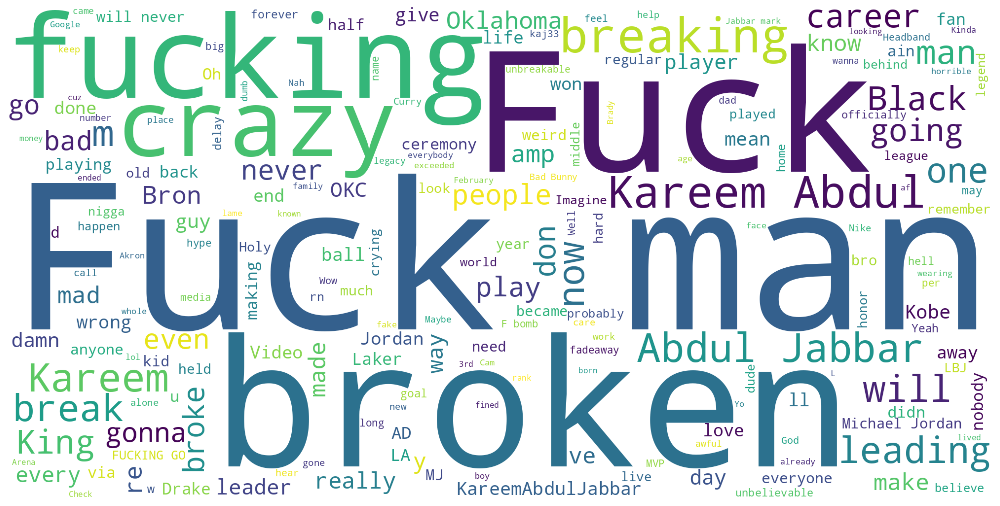

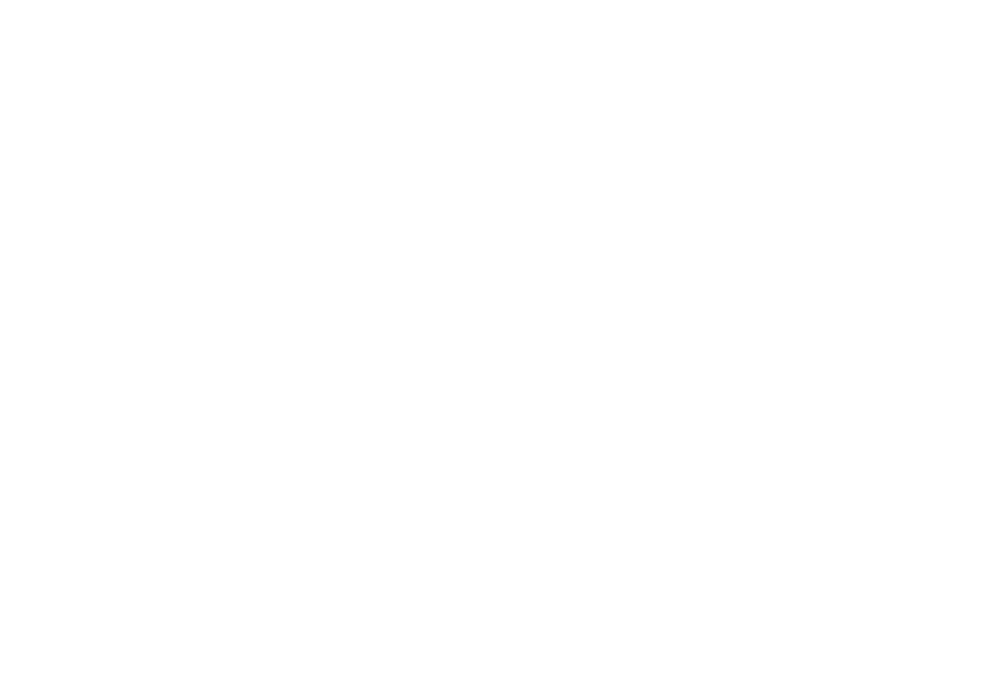

<Figure size 432x288 with 0 Axes>

In [57]:
hater = list(negative_group_df["Tweet"])

new_words = []
exclude_words = {'lebron','james','https','t','co','s','nba','game'}
 
for tweet in hater:
  words = re.split('\W+', tweet)
  words = [word for word in words if not any(bad in word.lower() for bad in exclude_words)]
  new_words.extend(words)
#:goat:
#1



#print(new_players)

wordcloud = WordCloud(width=2000, height=1000, background_color='white', max_font_size=2500).generate(' '.join(new_words))

#displayed using matplot(not really working In Google environment atleast the word cloud wasn't)
plt.figure(figsize=(15, 15), dpi=600)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.tight_layout(pad=0)
plt.show()
#saved results as image first
plt.savefig('wordcloud.png', dpi=800, bbox_inches='tight')
#plt.savefig('wordcloud.pdf', bbox_inches='tight')
#Here I am displaying the saved image. This was the only wayy I could actually get it to show up
Image(filename='wordcloud.png')

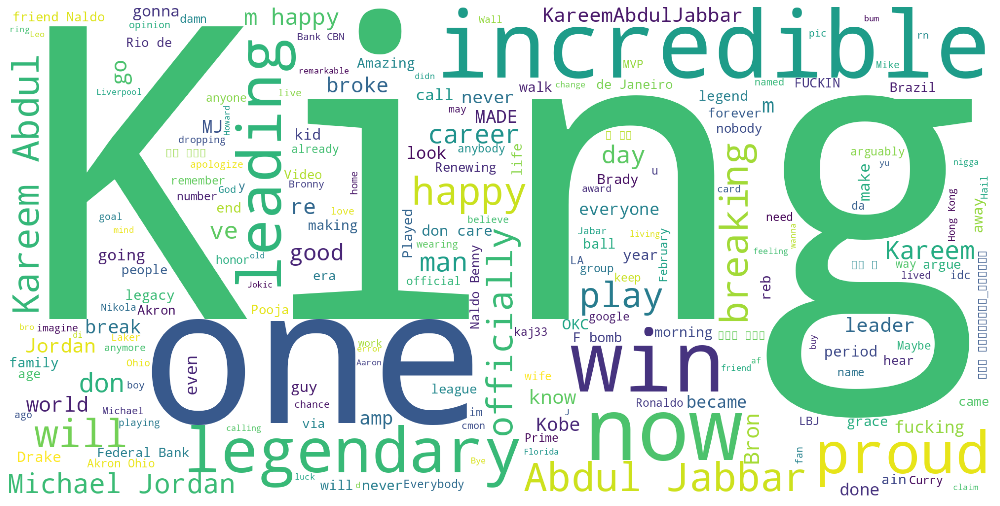

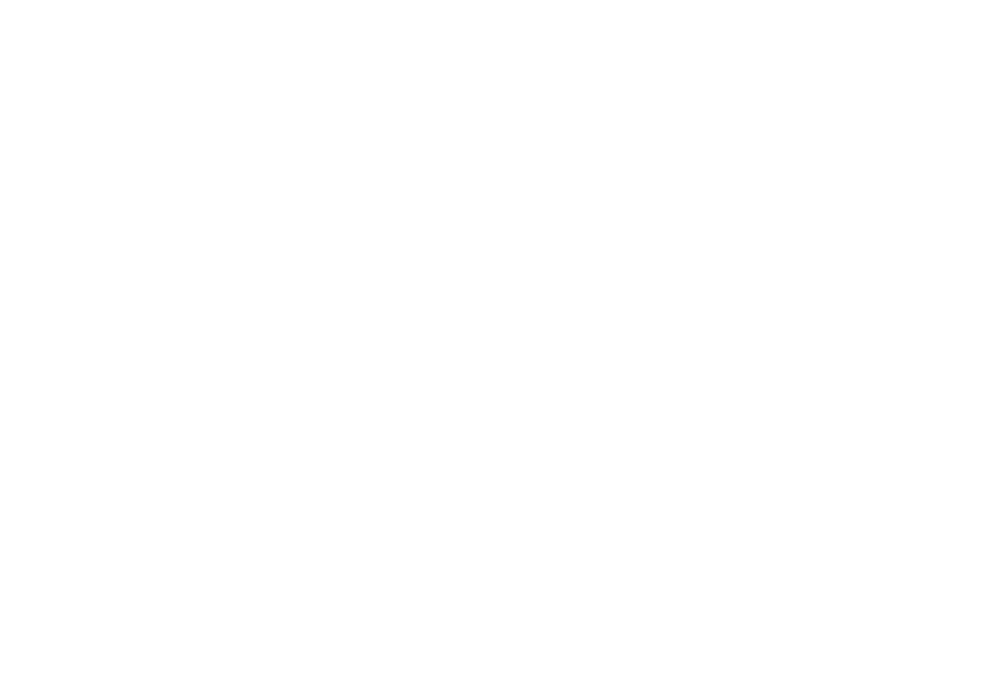

<Figure size 432x288 with 0 Axes>

In [60]:
fan = list(verypositive_group_df["Tweet"])


new_words = []
exclude_words = {'lebron','james','https','t','co','s','nba','game','player','lol'}
 
for tweet in fan:
  words = re.split('\W+', tweet)
  words = [word for word in words if not any(bad in word.lower() for bad in exclude_words)]
  new_words.extend(words)
#:goat:
#1



#print(new_players)

wordcloud = WordCloud(width=2000, height=1000, background_color='white', max_font_size=2500).generate(' '.join(new_words))

#displayed using matplot(not really working In Google environment atleast the word cloud wasn't)
plt.figure(figsize=(15, 15), dpi=600)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.tight_layout(pad=0)
plt.show()
#saved results as image first
plt.savefig('wordcloud.png', dpi=800, bbox_inches='tight')
#plt.savefig('wordcloud.pdf', bbox_inches='tight')
#Here I am displaying the saved image. This was the only wayy I could actually get it to show up
Image(filename='wordcloud.png')

The user belows has interesting sentiment towards LeBron. They were negative when LeBron never had a Champiosnhip, but began prasing LeBron James once he won champioships (in 2012,2013,2016 and 2020).

In 2020, this users states "I’m not a lebron fan but I am a fan of great basketball and not only is he the king but he’s the goat 🐐"

When LeBron broke the all time scoring record this user states, "He still not better then air Jordan. Be real, if yu started a NBA team today and yu had 1 pick between Michael Jordan, Kobe Bryant &amp; Lebron James who are yu picking ? I gotta take #23"

In [64]:
import warnings
import snscrape.modules.twitter as sntwitter
warnings.filterwarnings('ignore')
# Creating list to append tweet data to
tweets_list1 = []

# Using TwitterSearchScraper to scrape data and append tweets to list
for i,tweet in enumerate(sntwitter.TwitterSearchScraper('from:mrseahawk206 lebron').get_items()):
    if i>100:
        break
    tweets_list1.append([tweet.date, tweet.id, tweet.content, tweet.user.username])

# Creating a dataframe from the tweets list above
tweets_df1 = pd.DataFrame(tweets_list1, columns=['Datetime', 'Tweet Id', 'Text', 'Username'])

tweet1 = tweets_df1.sort_values(by=['Datetime'])
tweet1.head(10)

,Datetime,Tweet Id,Text,Username
78,2011-12-05 04:01:19+00:00,143540427600039936,"“@big10countryboi: ""@iRep_TeamLakers: 5 + 5 + ...",mrseahawk206
77,2011-12-08 03:57:35+00:00,144626651551109120,Why did Lebron James pack his bags & move to M...,mrseahawk206
76,2011-12-08 05:40:53+00:00,144652646261858304,"i keep my phone on Lebron, no Ring.",mrseahawk206
75,2011-12-12 04:03:17+00:00,146077636244938753,If I don't answer understand my phone is on L...,mrseahawk206
74,2012-01-13 02:00:47+00:00,157643220329840643,NBA leading scorer\n1 Kobe Bryant LAL 30.3\t\n...,mrseahawk206
73,2012-02-07 19:59:51+00:00,166974475424903168,@hiiphop my i phone ringer is lebron James #no...,mrseahawk206
72,2012-02-26 03:06:29+00:00,173604822006775808,Lebron can't grow it up top so he's growin it ...,mrseahawk206
71,2012-03-05 15:25:14+00:00,176689835543756800,If yu call me remember my phones ringtone is l...,mrseahawk206
70,2012-04-01 18:06:06+00:00,186514791874039808,“@teamKB24: LeBron James is amazing. Probably ...,mrseahawk206
69,2012-04-01 21:39:56+00:00,186568607214481408,“@swankness: Bosh be killin me w/ the facial e...,mrseahawk206


OG LeBron James Fans

In [65]:
cluster1 = myDataZ[myDataZ["kResult.clustering"] == 1]
cluster1

,ID,sentiment_score_avg,Date,User,Tweet,Source,kResult.clustering
0,0,0.400000,2023-02-08 15:59:46+00:00,mahmoudthegoose,The Lebron James documentary will win an Oscar...,Twitter for iPhone,1
9,9,0.500000,2023-02-08 15:59:17+00:00,TonyPrice71,THE MOST POINTS IN THE HISTORY OF THE #NBA = L...,Twitter for iPhone,1
32,32,0.500000,2023-02-08 15:58:07+00:00,AlphaQuise,Lebron James is the greatest player to ever to...,Twitter for iPhone,1
45,45,0.533333,2023-02-08 15:57:41+00:00,DariusM42986132,I ain’t gonna lie I was crying happy tear for ...,Twitter for iPhone,1
58,58,0.357143,2023-02-08 15:57:04+00:00,_alexjandro,Special Announcement from LeBron James\n\nFeb....,Twitter for iPhone,1
...,...,...,...,...,...,...,...
49973,49972,0.600000,2023-02-08 01:08:01+00:00,WalidMadi010,"""Lebron James: the greatest of all time. The m...",Twitter for iPhone,1
49981,49980,0.500000,2023-02-08 01:07:08+00:00,MonsterCardBrk,@AKsCards024 @sports_sell @TheHobby247 @ILOVEC...,Twitter for iPhone,1
49993,49992,0.600000,2023-02-08 01:05:34+00:00,JosephSauce1,@VeniceMase LeBron James is going to set up hi...,Twitter for Android,1
49995,49994,0.368750,2023-02-08 01:04:42+00:00,MG_Locks,Most books are backing Lebron to hit his over ...,Twitter Web App,1


In [67]:
tweets_list1 = []

# Using TwitterSearchScraper to scrape data and append tweets to list
for i,tweet in enumerate(sntwitter.TwitterSearchScraper('from:AlphaQuise	 lebron').get_items()):
    if i>100:
        break
    tweets_list1.append([tweet.date, tweet.id, tweet.content, tweet.user.username])

# Creating a dataframe from the tweets list above
tweets_df1 = pd.DataFrame(tweets_list1, columns=['Datetime', 'Tweet Id', 'Text', 'Username'])

tweet1 = tweets_df1.sort_values(by=['Datetime'])
tweet1.head(10)

,Datetime,Tweet Id,Text,Username
52,2012-02-27 00:48:00+00:00,173932357764657152,Oml Lebron,AlphaQuise
51,2012-03-08 00:59:00+00:00,177559005730840576,Lebron why did u have to finish that way,AlphaQuise
50,2012-05-24 22:18:40+00:00,205784909615337472,Some dumbass today said lebron don't pass gtfo,AlphaQuise
49,2012-06-04 03:32:29+00:00,209487764817842178,Nooooo not Lebron,AlphaQuise
48,2012-06-22 03:56:43+00:00,216016841422798848,Lebron finally got his 💍,AlphaQuise
47,2012-07-04 15:14:27+00:00,220536055831609346,RT @_AmazeMe: Lebron ain't make it to the NBA ...,AlphaQuise
46,2013-01-27 20:34:08+00:00,295630795035508737,Lebron!!!!!,AlphaQuise
45,2013-01-27 20:34:47+00:00,295630957048909826,RT @myfrogisSUPREME: SO LEBRON NOT CLUTCH 😂,AlphaQuise
44,2013-01-27 20:35:20+00:00,295631095901339648,RT @Ralphheat361: Lebron mother fuckn james,AlphaQuise
43,2013-01-27 20:35:32+00:00,295631145847095297,RT @RayDawkins25: Lebron is the best in the le...,AlphaQuise


Below is a fan that tweeted once about LeBron and it was negative (Cluster 4). 

In [73]:
tweets_list1 = []

# Using TwitterSearchScraper to scrape data and append tweets to list
for i,tweet in enumerate(sntwitter.TwitterSearchScraper('from:zizoukota47	 lebron').get_items()):
    if i>100:
        break
    tweets_list1.append([tweet.date, tweet.id, tweet.content, tweet.user.username])

# Creating a dataframe from the tweets list above
tweets_df1 = pd.DataFrame(tweets_list1, columns=['Datetime', 'Tweet Id', 'Text', 'Username'])

tweet1 = tweets_df1.sort_values(by=['Datetime'])
tweet1.head(10)

,Datetime,Tweet Id,Text,Username
0,2023-02-08 11:49:49+00:00,1623287986879340545,fuck lebron james. nobody cares,zizoukota47


#CONCLUSION

After our sentiment analysis on Twitter data, we can conclude that the sentiment of LeBron James did improve after he broke the all-time scoring record in the NBA. Fans went to Twitter to congratulate LeBron James and share their reactions and thoughts about the all-time scoring record being broken after nearly 40 years. However, there still are some fans who will hate on LeBron James regardless of his achievements. As LeBron James once said “Your hate makes me stronger.” and it shows through his professional career and achievements. 